In [1]:
import numpy as np
import sep
# additional setup for reading the test image and displaying plots
#import fitsio
from astropy.io import fits
import matplotlib.pyplot as plt
from matplotlib import rcParams

%matplotlib inline

rcParams['figure.figsize'] = [18., 15.]

In [2]:
# read image into standard 2-d numpy array
hdu = fits.open("../He_diff_parte.fits")
hdu[0].data

array([[ 1.22956635e+02,  1.25862671e+02,  2.02958221e+02, ...,
        -7.83337097e+01, -8.76452637e+00,  1.08655914e+02],
       [ 1.23146118e+02,  1.24472992e+02,  2.08661316e+02, ...,
        -6.89207153e+01, -2.71701050e+00,  8.51657715e+01],
       [ 2.46831116e+02,  1.98949280e+02, -2.37890015e+01, ...,
        -5.74740601e+01,  4.02587891e+00,  1.15999298e+02],
       ...,
       [ 2.01743774e+01,  2.87658691e+00, -7.84301758e-02, ...,
         3.72628479e+01,  6.48727722e+01,  5.25695496e+01],
       [ 1.84010620e+01,  1.61083984e+00, -1.18389893e+00, ...,
         3.82861633e+01,  1.57559204e+00,  5.12689209e+01],
       [ 1.68916016e+01,  8.37463379e-01, -1.46093750e+00, ...,
         3.80321045e+01,  1.90441895e+00,  5.21501007e+01]], dtype=float32)

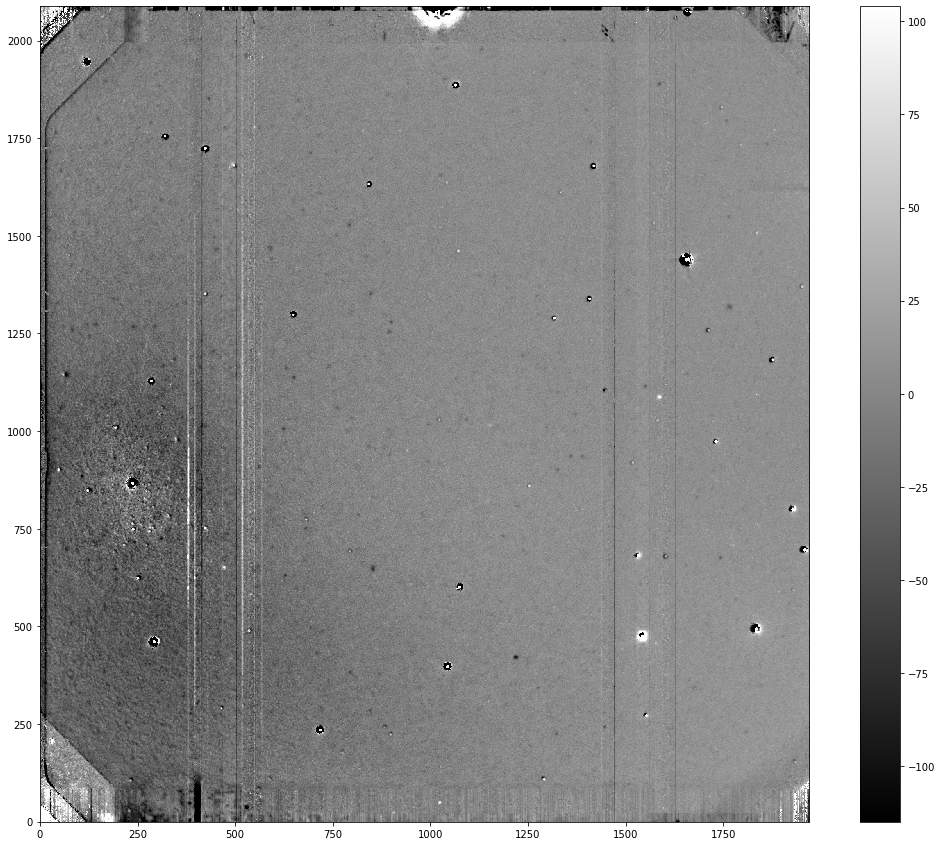

In [3]:
# show the image
m, s = np.mean(hdu[0].data), np.std(hdu[0].data)
plt.imshow(hdu[0].data, interpolation='nearest', cmap='gray', vmin=m-s, vmax=m+s, origin='lower')
plt.colorbar();
#plt.savefig("difference_Ha.jpg")

In [4]:
data = hdu[0].data[80:-80]
len(data)

1928

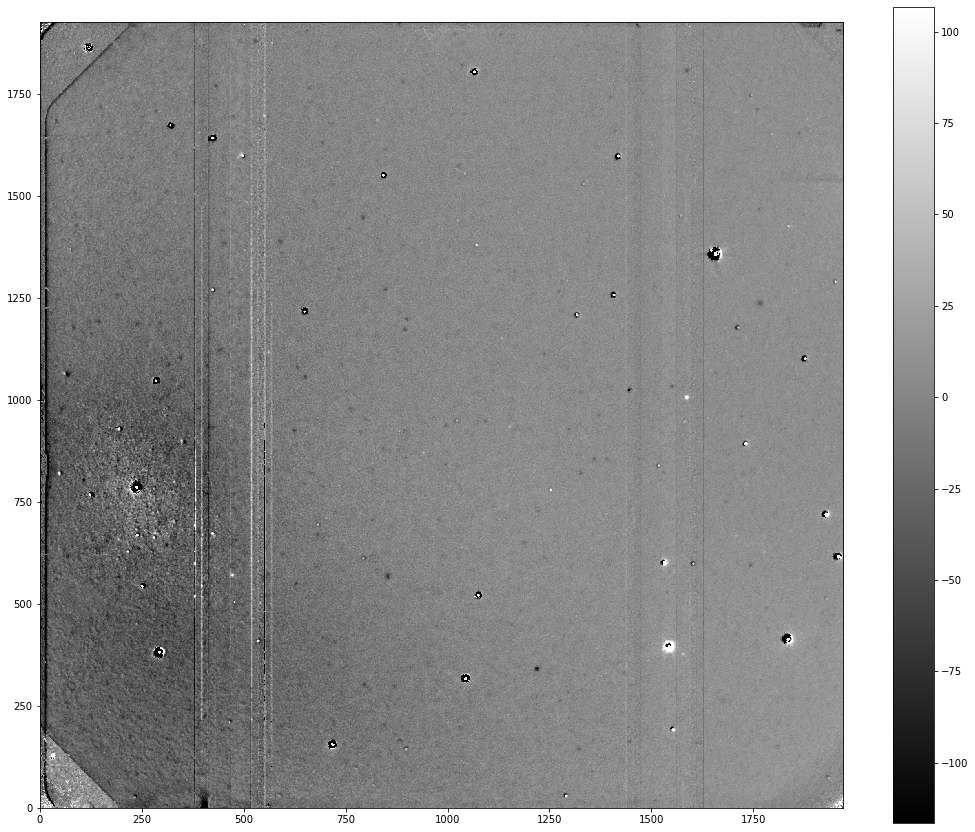

In [5]:
# show the image
m, s = np.mean(data), np.std(data)
plt.imshow(data, interpolation='nearest', cmap='gray', vmin=m-s, vmax=m+s, origin='lower')
plt.colorbar();

# Crop the image

I cut the image to avoid the problematic regions

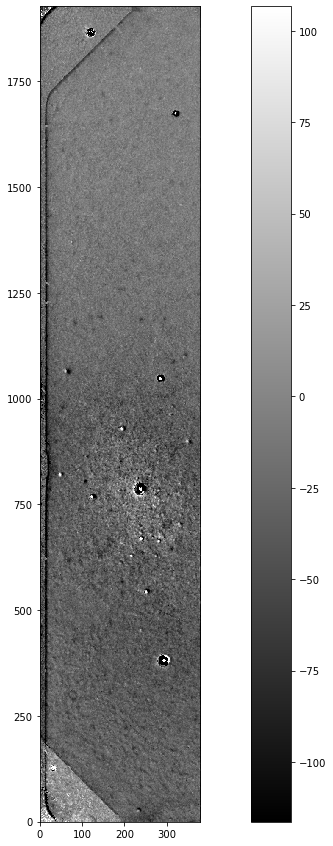

In [6]:
data_c1 = hdu[0].data[80:-80:,0:380]
# show the image
m, s = np.mean(data), np.std(data)
plt.imshow(data_c1, interpolation='nearest', cmap='gray', vmin=m-s, vmax=m+s, origin='lower')
plt.colorbar();

In [7]:
data_c1 = data_c1.byteswap().newbyteorder()
try:
    objects_crop1 = sep.extract(data_c1, 30, err=None)
except:
    print("Nathing to do")

In [8]:
len(objects_crop1)

116

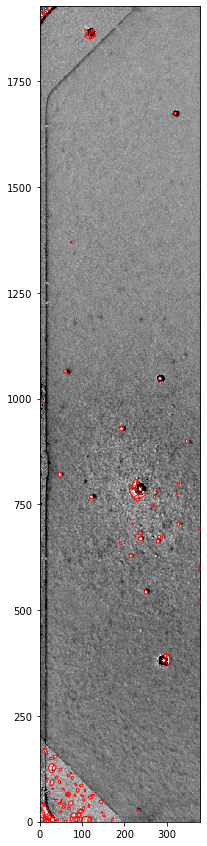

In [9]:
# plot background-subtracted image
from matplotlib.patches import Ellipse
fig, ax = plt.subplots()
m, s = np.mean(data_c1), np.std(data_c1)
im = ax.imshow(data_c1, interpolation='nearest', cmap='gray',
               vmin=m-s, vmax=m+s, origin='lower')

# plot an ellipse for each object
for i in range(len(objects_crop1)):
    e = Ellipse(xy=(objects_crop1['x'][i], objects_crop1['y'][i]),
                width=6*objects_crop1['a'][i],
                height=6*objects_crop1['b'][i],
                angle=objects_crop1['theta'][i] * 180. / np.pi)
    e.set_facecolor('none')
    e.set_edgecolor('red')
    ax.add_artist(e)
#plt.savefig("difference_Ha-sources.jpg")

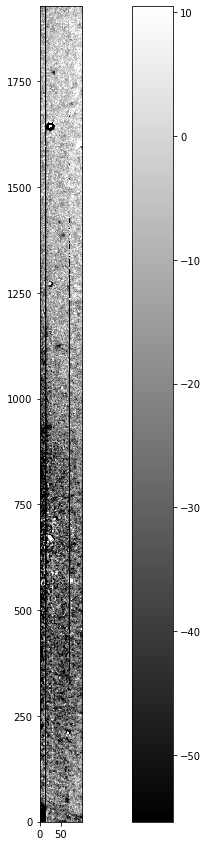

In [10]:
data_c2 = hdu[0].data[80:-80:,400:500]
# show the image
m, s = np.mean(data_c2), np.std(data_c2)
plt.imshow(data_c2, interpolation='nearest', cmap='gray', vmin=m-s, vmax=m+s, origin='lower')
plt.colorbar();

In [11]:
data_c2 = data_c2.byteswap().newbyteorder()
try:
    objects_crop2 = sep.extract(data_c2, 30, err=None)
except:
    print("Nathing to do")

In [12]:
len(objects_crop2)

7

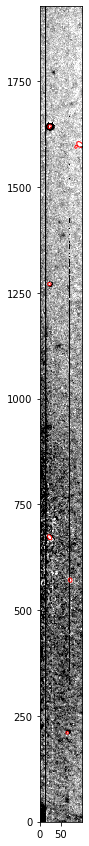

In [13]:
# plot background-subtracted image
fig, ax = plt.subplots()
m, s = np.mean(data_c2), np.std(data_c2)
im = ax.imshow(data_c2, interpolation='nearest', cmap='gray',
               vmin=m-s, vmax=m+s, origin='lower')

# plot an ellipse for each object
for i in range(len(objects_crop2)):
    e = Ellipse(xy=(objects_crop2['x'][i], objects_crop2['y'][i]),
                width=6*objects_crop2['a'][i],
                height=6*objects_crop2['b'][i],
                angle=objects_crop2['theta'][i] * 180. / np.pi)
    e.set_facecolor('none')
    e.set_edgecolor('red')
    ax.add_artist(e)
#plt.savefig("difference_Ha-sources.jpg")

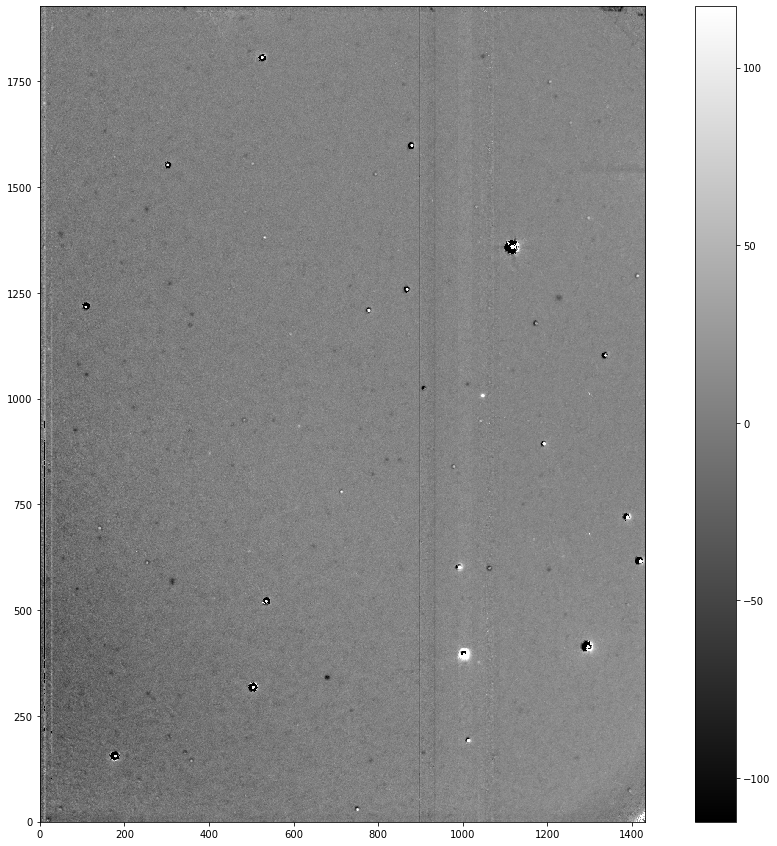

In [14]:
data_c3 = hdu[0].data[80:-80:,540:]
# show the image
m, s = np.mean(data_c3), np.std(data_c3)
plt.imshow(data_c3, interpolation='nearest', cmap='gray', vmin=m-s, vmax=m+s, origin='lower')
plt.colorbar();

In [15]:
data_c3 = data_c3.byteswap().newbyteorder()
try:
    objects_crop3 = sep.extract(data_c3, 30, err=None)
except:
    print("Nathing to do")

In [16]:
len(objects_crop3)

76

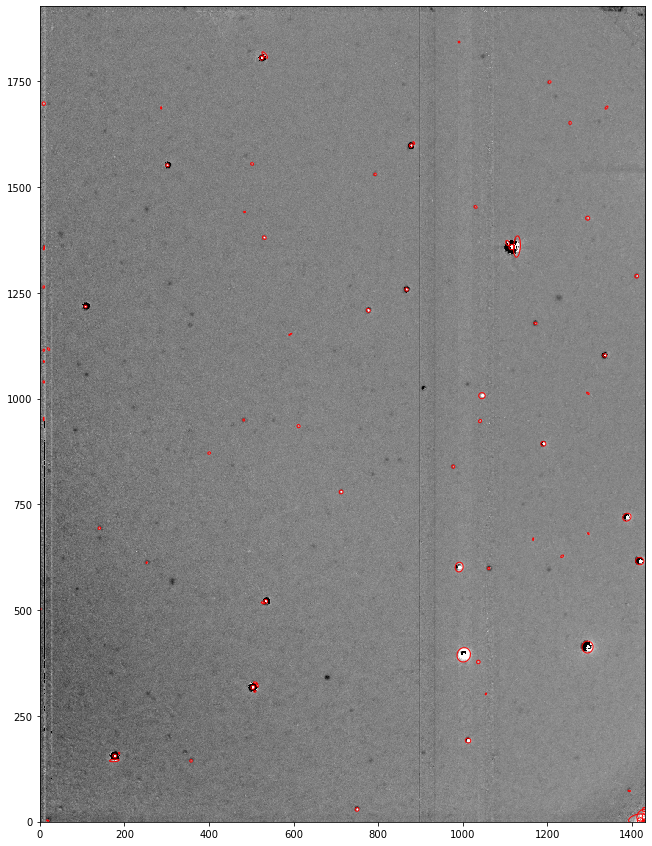

In [17]:
# plot background-subtracted image
fig, ax = plt.subplots()
m, s = np.mean(data_c3), np.std(data_c3)
im = ax.imshow(data_c3, interpolation='nearest', cmap='gray',
               vmin=m-s, vmax=m+s, origin='lower')

# plot an ellipse for each object
for i in range(len(objects_crop3)):
    e = Ellipse(xy=(objects_crop3['x'][i], objects_crop3['y'][i]),
                width=6*objects_crop3['a'][i],
                height=6*objects_crop3['b'][i],
                angle=objects_crop3['theta'][i] * 180. / np.pi)
    e.set_facecolor('none')
    e.set_edgecolor('red')
    ax.add_artist(e)
#plt.savefig("difference_Ha-sources.jpg")

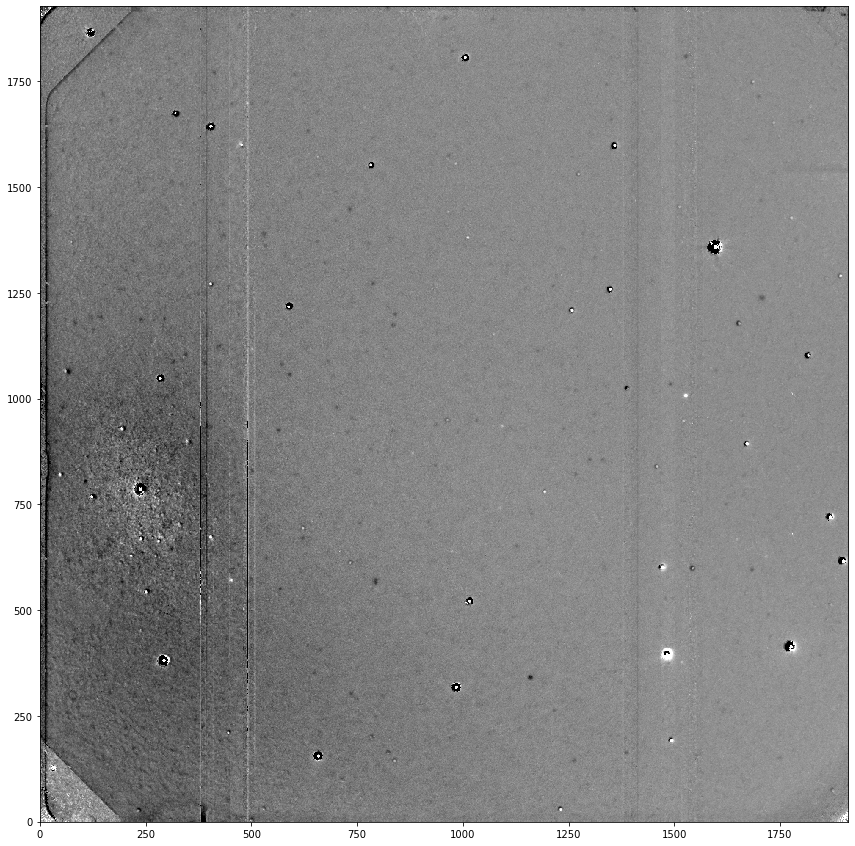

In [18]:
data_total = np.hstack((data_c1, data_c2, data_c3))
# show the image
m, s = np.mean(data_total), np.std(data_total)
plt.imshow(data_total, interpolation='nearest', cmap='gray', vmin=m-s, vmax=m+s, origin='lower')
#plt.colorbar();

In [19]:
# coverting in array
data_crop = data_total.byteswap().newbyteorder()

In [20]:
try:
    objects_crop = sep.extract(data_total, 30., err=None)
except:
    print("Nathing to do")

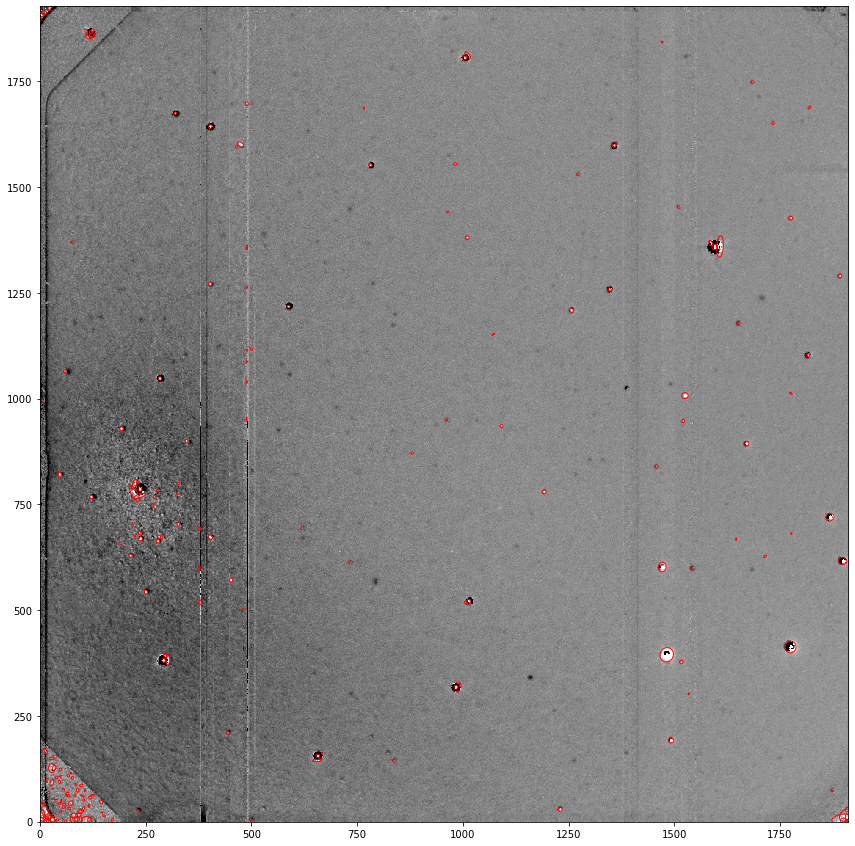

In [21]:
from matplotlib.patches import Ellipse

# plot background-subtracted image
fig, ax = plt.subplots()
m, s = np.mean(data_total), np.std(data_total)
im = ax.imshow(data_total, interpolation='nearest', cmap='gray',
               vmin=m-s, vmax=m+s, origin='lower')

# plot an ellipse for each object
for i in range(len(objects_crop)):
    e = Ellipse(xy=(objects_crop['x'][i], objects_crop['y'][i]),
                width=6*objects_crop['a'][i],
                height=6*objects_crop['b'][i],
                angle=objects_crop['theta'][i] * 180. / np.pi)
    e.set_facecolor('none')
    e.set_edgecolor('red')
    ax.add_artist(e)
#plt.savefig("difference_Ha-sources.jpg")

# Original data

In [22]:
# coverting in array
data = hdu[0].data[80:-80].byteswap().newbyteorder()

In [23]:
try:
    objects = sep.extract(data, 30., err=None)
except:
    print("Nathing to do")

In [24]:
len(objects)

287

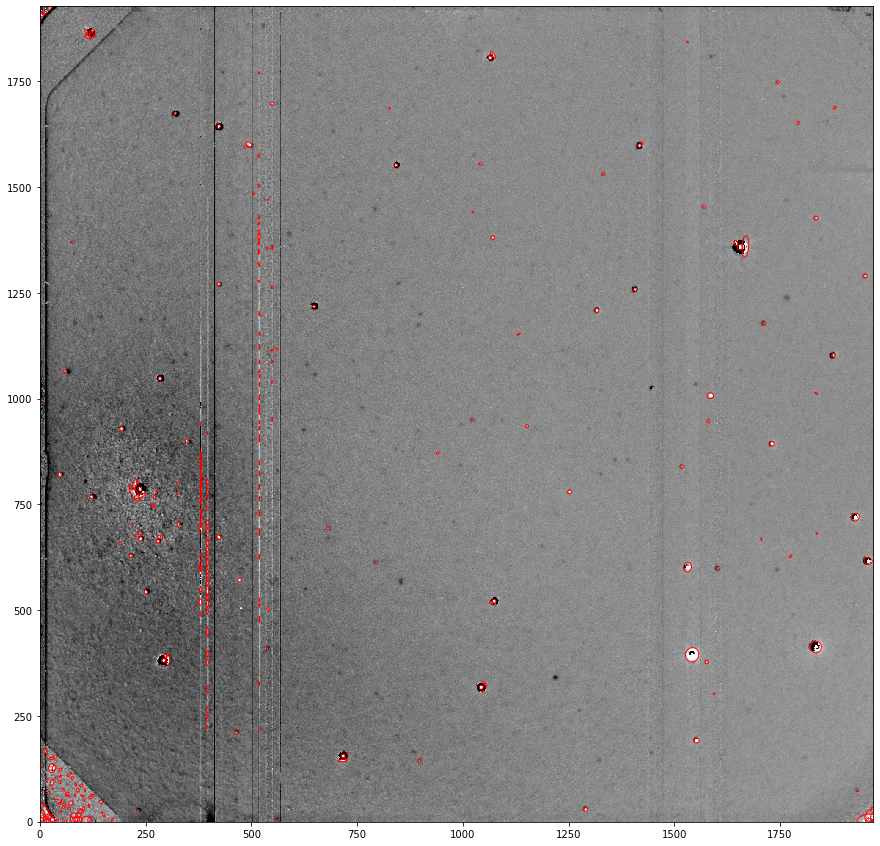

In [25]:
from matplotlib.patches import Ellipse

# plot background-subtracted image
fig, ax = plt.subplots()
m, s = np.mean(data), np.std(data)
im = ax.imshow(data, interpolation='nearest', cmap='gray',
               vmin=m-s, vmax=m+s, origin='lower')

# plot an ellipse for each object
for i in range(len(objects)):
    e = Ellipse(xy=(objects['x'][i], objects['y'][i]),
                width=6*objects['a'][i],
                height=6*objects['b'][i],
                angle=objects['theta'][i] * 180. / np.pi)
    e.set_facecolor('none')
    e.set_edgecolor('red')
    ax.add_artist(e)
#plt.savefig("difference_Ha-sources.jpg")

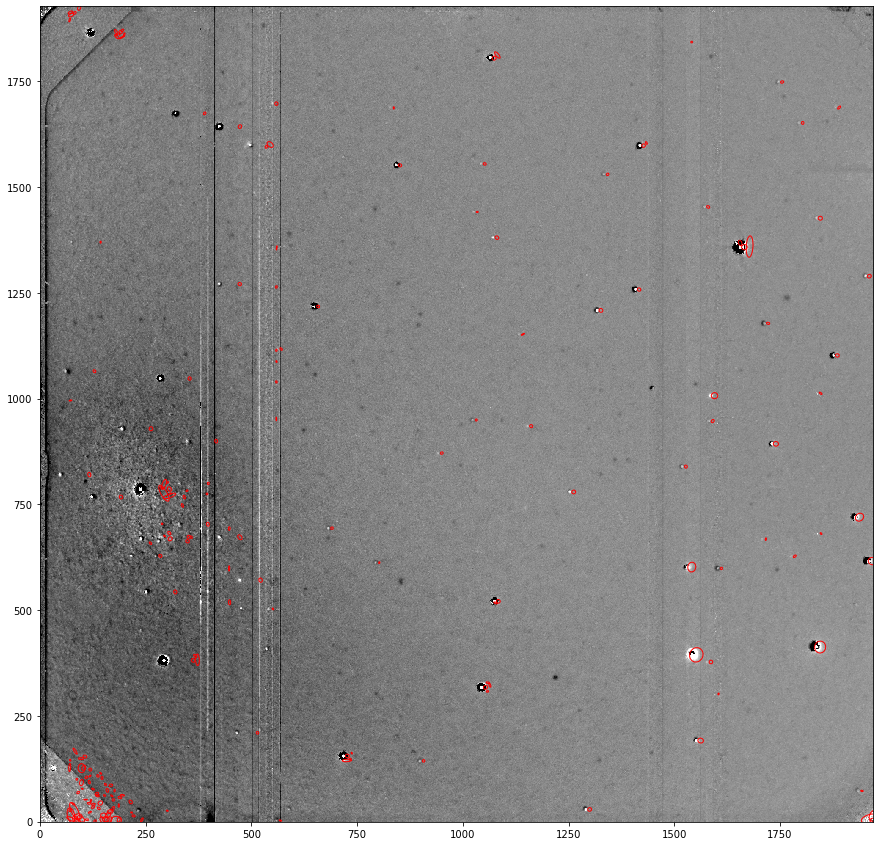

In [26]:
# plot background-subtracted image
fig, ax = plt.subplots()
m, s = np.mean(data), np.std(data)
im = ax.imshow(data, interpolation='nearest', cmap='gray',
               vmin=m-s, vmax=m+s, origin='lower')

# plot an ellipse for each object
for i in range(len(objects_crop)):
    e = Ellipse(xy=(objects_crop['x'][i]+70, objects_crop['y'][i]),
                width=6*objects_crop['a'][i],
                height=6*objects_crop['b'][i],
                angle=objects_crop['theta'][i] * 180. / np.pi)
    e.set_facecolor('none')
    e.set_edgecolor('red')
    ax.add_artist(e)
#plt.savefig("difference_Ha-sources.jpg")

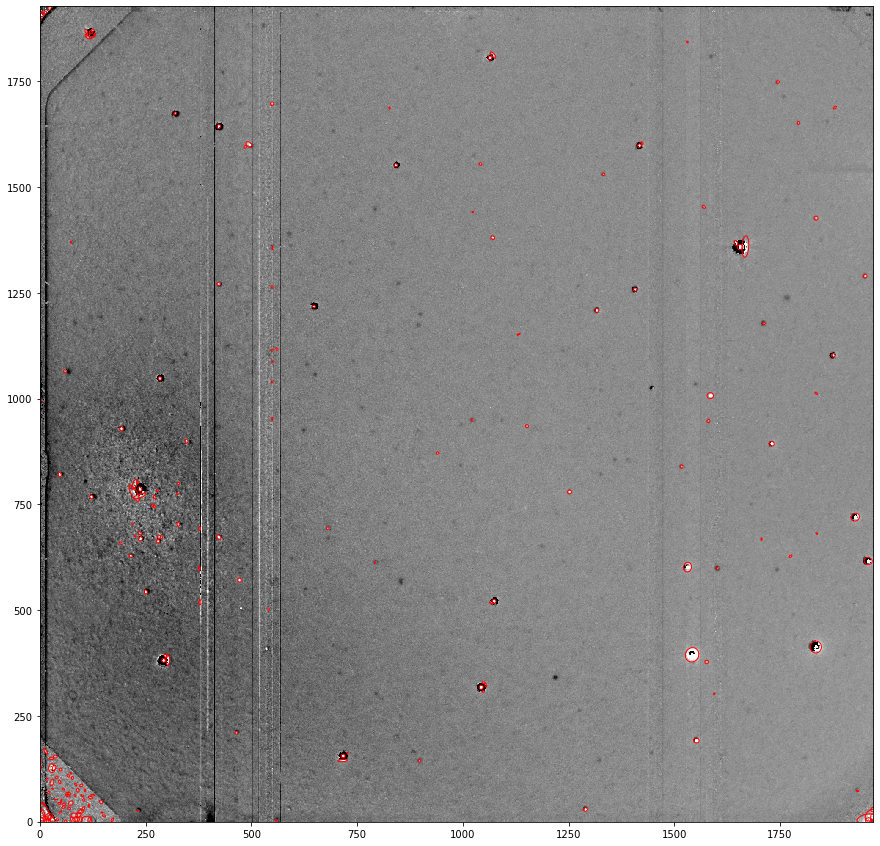

In [27]:
# plot background-subtracted image
fig, ax = plt.subplots()
m, s = np.mean(data), np.std(data)
im = ax.imshow(data, interpolation='nearest', cmap='gray',
               vmin=m-s, vmax=m+s, origin='lower')

# plot an ellipse for each object
for i in range(len(objects_crop1)):
    e = Ellipse(xy=(objects_crop1['x'][i], objects_crop1['y'][i]),
                width=6*objects_crop1['a'][i],
                height=6*objects_crop1['b'][i],
                angle=objects_crop1['theta'][i] * 180. / np.pi)
    e.set_facecolor('none')
    e.set_edgecolor('red')
    ax.add_artist(e)

# plot an ellipse for each object
for i in range(len(objects_crop2)):
    e = Ellipse(xy=(objects_crop2['x'][i]+400, objects_crop2['y'][i]),
                width=6*objects_crop2['a'][i],
                height=6*objects_crop2['b'][i],
                angle=objects_crop2['theta'][i] * 180. / np.pi)
    e.set_facecolor('none')
    e.set_edgecolor('red')
    ax.add_artist(e)
    
# plot an ellipse for each object
for i in range(len(objects_crop3)):
    e2 = Ellipse(xy=(objects_crop3['x'][i]+540, objects_crop3['y'][i]),
                width=6*objects_crop3['a'][i],
                height=6*objects_crop3['b'][i],
                angle=objects_crop3['theta'][i] * 180. / np.pi)
    e2.set_facecolor('none')
    e2.set_edgecolor('red')
    ax.add_artist(e2)
plt.savefig("../difference_HeII-sources.jpg")

# Converting pixels in celestial coorditates

In [28]:
from astropy.wcs import WCS
mywcs = WCS(hdu[0].header)
newf = fits.PrimaryHDU()
newf.data = hdu[0].data[80:-80:,0:380]
newf.header = hdu[0].header
newf.header.update(mywcs[80:-80:,0:380].to_header())
mywcs_new1 = WCS(hdu[0].header)

rai, deci = [], []
x, y = objects_crop1['x'], objects_crop1['y']
for xi, yi in zip(x, y):
    ra, dec = mywcs_new1.all_pix2world([[xi, yi]], 0)[0]
    rai.append(ra)
    deci.append(dec)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


In [29]:
newf.data = hdu[0].data[80:-80:,400:500]
newf.header = hdu[0].header
newf.header.update(mywcs[80:-80:,400:500].to_header())
mywcs_new2 = WCS(hdu[0].header)

x2, y2 = objects_crop2['x'], objects_crop2['y']
for xii, yii in zip(x2, y2):
    ra, dec = mywcs_new2.all_pix2world([[xii, yii]], 0)[0]
    rai.append(ra)
    deci.append(dec)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


In [30]:
newf.data = hdu[0].data[80:-80:,540:]
newf.header = hdu[0].header
newf.header.update(mywcs[80:-80:,540:].to_header())
mywcs_new3 = WCS(hdu[0].header)

x3, y3 = objects_crop3['x'], objects_crop3['y']
for xiii, yiii in zip(x3, y3):
    ra, dec = mywcs_new3.all_pix2world([[xiii, yiii]], 0)[0]
    rai.append(ra)
    deci.append(dec)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


In [31]:
ID = []
for j in range(len(rai)):
    ID.append("S"+str(j))   

In [32]:
tr, flux, flag = np.hstack((objects_crop1['thresh'], objects_crop2['thresh'], objects_crop3['thresh'])), np.hstack((objects_crop1['flux'], objects_crop2['flux'], objects_crop3['flux'])), np.hstack((objects_crop1['flag'], objects_crop2['flag'], objects_crop3['flag']))

In [33]:
xt, yt = np.hstack((objects_crop1['x'], objects_crop2['x'], objects_crop3['x'])), np.hstack((objects_crop1['y'], objects_crop2['y'], objects_crop3['y']))

In [34]:
arr = np.empty((len(rai), 7), dtype=np.float64)
arr.shape

(199, 7)

In [35]:
arr[:,0] = rai
arr[:,1] = deci
arr[:,2] = xt
arr[:,3] = yt
arr[:,4] = tr
arr[:,5] = flux
arr[:,6] = flag

In [36]:
from astropy.table import Table

t = Table(arr, names=('RA', 'DEC',  'x', 'y', 'thresh', 'flux', 'flag'), meta={'name': 'first table'})
t["ID"] = ID
Col = ["ID", 'RA', 'DEC', 'x', 'y', 'thresh', 'flux', 'flag']
t_new = t[Col]

In [37]:
t_new.write("../emitters/HeII-candidates-sep.dat", format="ascii")

$\textbf{Creating DS9 regions}$

In [38]:
from catalog_utils import region_lines_from_table
regionfile = '../emitters/HeII-candidates-sep.reg'
with open(regionfile, 'w') as f:
    f.write('\n'.join(region_lines_from_table(t, name='ID', ra='RA', dec='DEC', color='#44cc66')))

In [39]:
# available fields
objects.dtype.names

('thresh',
 'npix',
 'tnpix',
 'xmin',
 'xmax',
 'ymin',
 'ymax',
 'x',
 'y',
 'x2',
 'y2',
 'xy',
 'errx2',
 'erry2',
 'errxy',
 'a',
 'b',
 'theta',
 'cxx',
 'cyy',
 'cxy',
 'cflux',
 'flux',
 'cpeak',
 'peak',
 'xcpeak',
 'ycpeak',
 'xpeak',
 'ypeak',
 'flag')

# Aperture photometry

In [40]:
flux, fluxerr, flag = sep.sum_circle(data, objects['x'], objects['y'],
                                     3.0, gain=1.0)

In [41]:
# show the first 10 objects results:
for i in range(10):
    print("object {:d}: flux = {:f} +/- {:f}".format(i, flux[i], fluxerr[i]))

object 0: flux = 878.224939 +/- 29.634860
object 1: flux = 193.824404 +/- 13.922083
object 2: flux = 638.072079 +/- 25.260089
object 3: flux = 830.560583 +/- 28.819448
object 4: flux = 778.226235 +/- 27.896707
object 5: flux = 560.080464 +/- 23.666019
object 6: flux = 722.851587 +/- 26.885899
object 7: flux = 314.485024 +/- 17.733726
object 8: flux = 1219.476013 +/- 34.920997
object 9: flux = 3197.409133 +/- 56.545638


# OVI image

In [42]:
# read image into standard 2-d numpy array
hdu1 = fits.open("../diff_OVI27.fits")
hdu1[0].data

array([[1184.31242598,  878.86671564, 1590.74789515, ...,  156.97706388,
         713.19082904,  892.9806207 ],
       [1157.17464857, 1395.27790832, 1016.57852127, ...,  416.47873975,
         620.68002671,  340.11587269],
       [ 632.7829895 ,  827.01898019,  926.63592697, ...,  484.13447794,
         411.25989459,  191.35785749],
       ...,
       [ -35.15279901, -331.34770913, -369.51430478, ...,   -9.07380807,
          20.30928958,  -48.68931638],
       [ -49.79733026, -321.1101603 , -326.54164853, ...,  -76.44319284,
          92.42684329,   58.52889834],
       [ -64.43453729, -462.38017983, -444.43022251, ...,   72.17204154,
          27.89200442,  -66.58798822]])

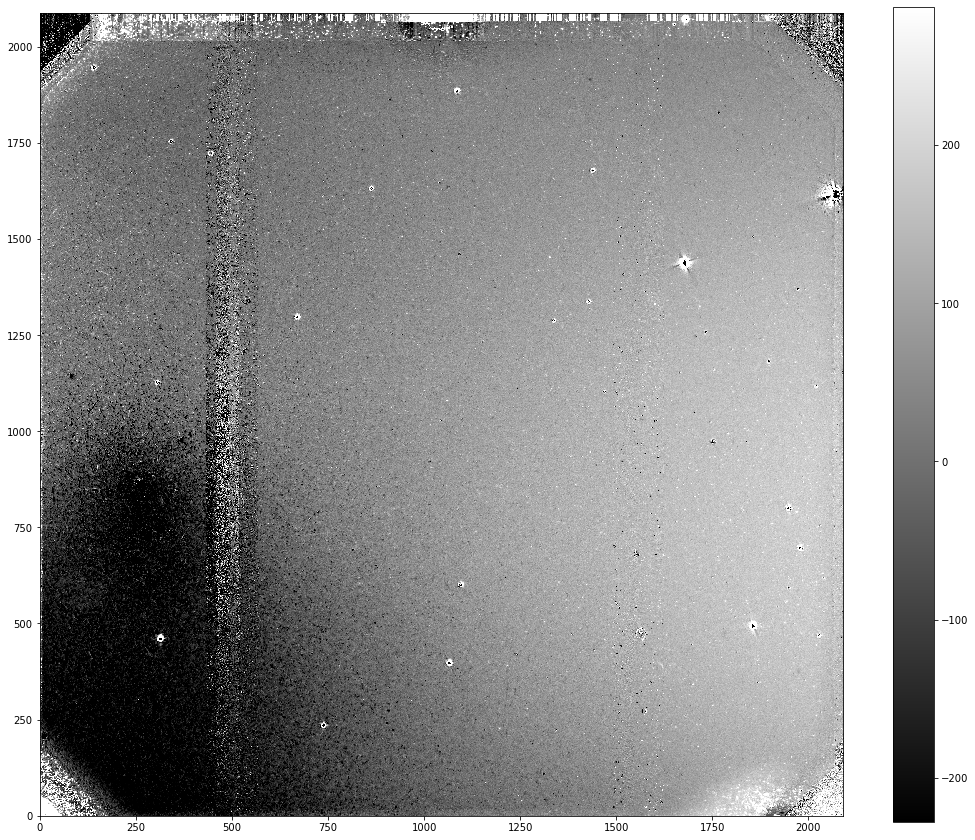

In [43]:
# show the image
m, s = np.mean(hdu1[0].data), np.std(hdu1[0].data)
plt.imshow(hdu1[0].data, interpolation='nearest', cmap='gray', vmin=m-s, vmax=m+s, origin='lower')
plt.colorbar();
#plt.savefig("difference_Ha.jpg")

$\textbf{Object detection}$

In [44]:
#data1 = hdu1[0].data[0:-65,0:-50]
#len(data1)
# coverting in array
data1 = hdu1[0].data[0:-80,20:-50].byteswap().newbyteorder()

In [45]:
try:
    objects1 = sep.extract(data1, 300., err=None)#, mask=None, minarea=5, 
                                    #filter_type='matched', deblend_nthresh=32, deblend_cont=0.005, clean=True, 
                                                          #clean_param=1.0, segmentation_map=False)
except:
    print("Nathing to do")

In [46]:
# how many objects were detected
len(objects1)

302

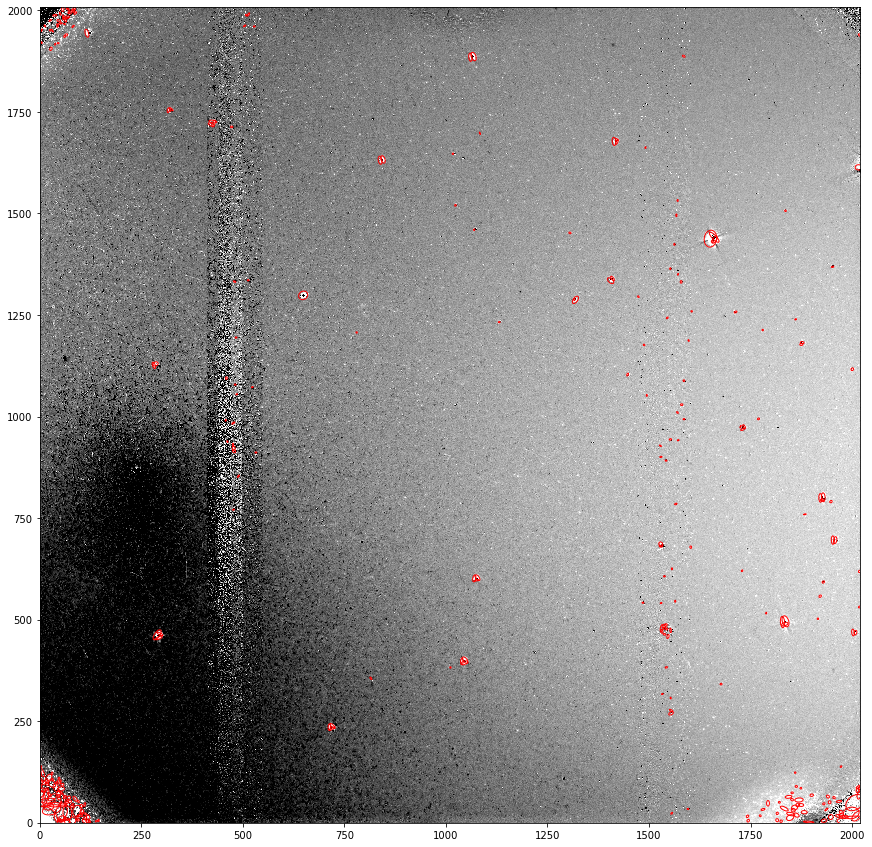

In [47]:
from matplotlib.patches import Ellipse

# plot background-subtracted image
fig, ax = plt.subplots()
m, s = np.mean(data1), np.std(data1)
im = ax.imshow(data1, interpolation='nearest', cmap='gray',
               vmin=m-s, vmax=m+s, origin='lower')

# plot an ellipse for each object
for i in range(len(objects1)):
    e = Ellipse(xy=(objects1['x'][i], objects1['y'][i]),
                width=6*objects1['a'][i],
                height=6*objects1['b'][i],
                angle=objects1['theta'][i] * 180. / np.pi)
    e.set_facecolor('none')
    e.set_edgecolor('red')
    ax.add_artist(e)
plt.savefig("../difference_OVI-sources.jpg")

In [48]:
mywcs_he = WCS(hdu1[0].header)
newf_he = fits.PrimaryHDU()
newf_he.data = hdu1[0].data[0:-80,20:-50]
newf_he.header = hdu1[0].header
newf_he.header.update(mywcs_he[0:-80,20:-50].to_header())
mywcs_new_he = WCS(hdu1[0].header)

rai1, deci1 = [], []
x1, y1 = objects1['x'], objects1['y']
for xi1, yi1 in zip(x1, y1):
    ra, dec = mywcs_new_he.all_pix2world([[xi1, yi1]], 0)[0]
    rai1.append(ra)
    deci1.append(dec)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


In [49]:
ID1 = []
for j in range(len(objects1)):
    ID1.append("S"+str(j))

In [50]:
tr1, flux1, flag1 = objects1['thresh'], objects1['flux'], objects1['flag']

In [51]:
arr1 = np.empty((len(objects1), 7), dtype=np.float64)
arr1.shape

(302, 7)

In [52]:
arr1[:,0] = rai1
arr1[:,1] = deci1
arr1[:,2] = x1
arr1[:,3] = y1
arr1[:,4] = tr1
arr1[:,5] = flux1
arr1[:,6] = flag1


In [53]:
t1 = Table(arr1, names=('RA', 'DEC', 'x', 'y', 'thresh', 'flux', 'flag'), meta={'name': 'first table'})
t1["ID"] = ID1
Col1 = ["ID", 'RA', 'DEC', 'x', 'y', 'thresh', 'flux', 'flag']
t_new1 = t1[Col1]

In [54]:
t_new1.write("../emitters/OVI-candidates-sep.dat", format="ascii")

In [55]:
regionfile1 = '../emitters/OVI-candidates-sep.reg'
with open(regionfile1, 'w') as f:
    f.write('\n'.join(region_lines_from_table(t1, name='ID', ra='RA', dec='DEC', color='#1f77b4')))